In [3]:
from PIL import Image

Image.open('data/iam_form.png').width, Image.open('data/iam_form.png').height

(2479, 3542)

In [1]:
import pandas as pd
import os
from PIL import Image

def get_dataset(dataset_path):
    if not os.path.exists(dataset_path):
        print("Dataset not found")
        return None
    dataset = []

    for folder in os.listdir(dataset_path):
        if not os.path.isdir(os.path.join(dataset_path, folder)):
            continue
        for i, file in enumerate(os.listdir(dataset_path + '/' + folder)):
            if not file.endswith('.png'):
                continue
            csv_file = dataset_path + '/' + folder + '/' + file[:-4] + '.csv'
            res_df = pd.read_csv(csv_file)
            image_path = os.path.join(dataset_path, folder, file)
            y = res_df['y'].to_numpy()
            image = Image.open(image_path).convert('RGB')
            width = image.width
            height = image.height
            bbox = [[0, y_i, width, 150] for y_i in y]
            objects = {
                'bbox': bbox,
                'category': [0] * len(y),
                'area': [150 * width] * len(y)
            }
            dataset.append({
                'image_id': i,
                'image': image,
                'width': width,
                'height': height,
                'objects': objects
            })

    return {
        'train': dataset[:int(0.8 * len(dataset))],
        'validation': dataset[int(0.8 * len(dataset)):int(0.9 * len(dataset))],
        'test': dataset[int(0.9 * len(dataset)):],
    }

dataset = get_dataset('synthetic_dataset')
dataset['train'][0]

{'image_id': 1,
 'image': <PIL.Image.Image image mode=RGB size=2479x3542>,
 'width': 2479,
 'height': 3542,
 'objects': {'bbox': [[0, 900, 2479, 150],
   [0, 1100, 2479, 150],
   [0, 1250, 2479, 150],
   [0, 1600, 2479, 150],
   [0, 1800, 2479, 150],
   [0, 1950, 2479, 150],
   [0, 2150, 2479, 150],
   [0, 2300, 2479, 150],
   [0, 2500, 2479, 150],
   [0, 2650, 2479, 150]],
  'category': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
  'area': [371850,
   371850,
   371850,
   371850,
   371850,
   371850,
   371850,
   371850,
   371850,
   371850]}}

[0, 900, 2479, 150]
[0, 1100, 2479, 150]
[0, 1250, 2479, 150]
[0, 1600, 2479, 150]
[0, 1800, 2479, 150]
[0, 1950, 2479, 150]
[0, 2150, 2479, 150]
[0, 2300, 2479, 150]
[0, 2500, 2479, 150]
[0, 2650, 2479, 150]


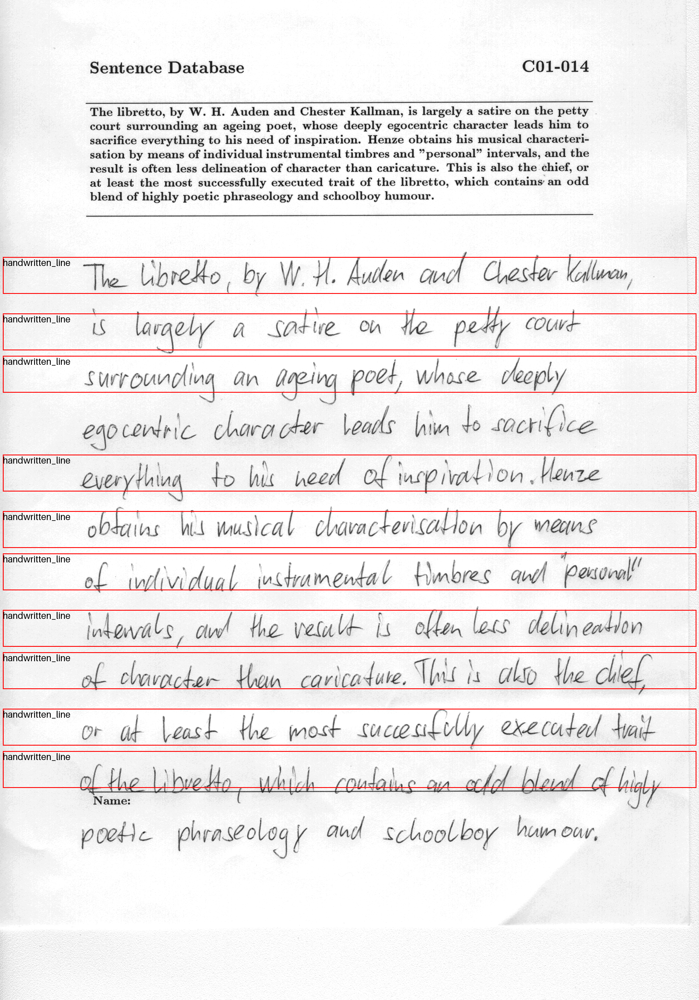

In [2]:
import numpy as np
import os
from PIL import Image, ImageDraw

index = 0

image = dataset["train"][index]["image"].convert("RGB")
annotations = dataset["train"][index]["objects"]
draw = ImageDraw.Draw(image)

categories = ["handwritten_line"]

id2label = {index: x for index, x in enumerate(categories, start=0)}
label2id = {v: k for k, v in id2label.items()}

for i in range(len(annotations["bbox"])):
    box = annotations["bbox"][i]
    print(box)
    class_idx = annotations["category"][i]
    x, y, w, h = tuple(box)
    x1, y1 = int(x + 10), int(y + 10)
    x2, y2 = int(x + w - 10), int(y + h -10)
    draw.rectangle([x1, y1, x2, y2], outline="red", width=3)
    draw.text((x1, y1), id2label[class_idx], fill="black", font_size=32)

image

In [3]:
from transformers import AutoImageProcessor

MODEL_NAME = "microsoft/conditional-detr-resnet-50"  # or "facebook/detr-resnet-50"
IMAGE_SIZE = 480

MAX_SIZE = IMAGE_SIZE

image_processor = AutoImageProcessor.from_pretrained(
    MODEL_NAME,
    do_resize=True,
    size={"max_height": MAX_SIZE, "max_width": MAX_SIZE},
    do_pad=True,
    pad_size={"height": MAX_SIZE, "width": MAX_SIZE},
)

/Users/amaljoe/Desktop/Workspace/IITB/NLP/OCR_with_LLMs/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [4]:
import albumentations as A

train_augment_and_transform = A.Compose(
    [
        A.Perspective(p=0.1),
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.HueSaturationValue(p=0.1),
    ],
    bbox_params=A.BboxParams(format="coco", label_fields=["category"], clip=True, min_area=25),
)

validation_transform = A.Compose(
    [A.NoOp()],
    bbox_params=A.BboxParams(format="coco", label_fields=["category"], clip=True),
)

In [5]:
def format_image_annotations_as_coco(image_id, categories, areas, bboxes):
    """Format one set of image annotations to the COCO format

    Args:
        image_id (str): image id. e.g. "0001"
        categories (List[int]): list of categories/class labels corresponding to provided bounding boxes
        areas (List[float]): list of corresponding areas to provided bounding boxes
        bboxes (List[Tuple[float]]): list of bounding boxes provided in COCO format
            ([center_x, center_y, width, height] in absolute coordinates)

    Returns:
        dict: {
            "image_id": image id,
            "annotations": list of formatted annotations
        }
    """
    annotations = []
    for category, area, bbox in zip(categories, areas, bboxes):
        formatted_annotation = {
            "image_id": image_id,
            "category_id": category,
            "iscrowd": 0,
            "area": area,
            "bbox": list(bbox),
        }
        annotations.append(formatted_annotation)

    return {
        "image_id": image_id,
        "annotations": annotations,
    }


In [6]:
def augment_and_transform_batch(examples, transform, image_processor, return_pixel_mask=False):
    """Apply augmentations and format annotations in COCO format for object detection task"""

    images = []
    annotations = []
    for image_id, image, objects in zip(examples["image_id"], examples["image"], examples["objects"]):
        image = np.array(image.convert("RGB"))

        # apply augmentations
        output = transform(image=image, bboxes=objects["bbox"], category=objects["category"])
        images.append(output["image"])

        # format annotations in COCO format
        formatted_annotations = format_image_annotations_as_coco(
            image_id, output["category"], objects["area"], output["bboxes"]
        )
        annotations.append(formatted_annotations)

    # Apply the image processor transformations: resizing, rescaling, normalization
    result = image_processor(images=images, annotations=annotations, return_tensors="pt")

    if not return_pixel_mask:
        result.pop("pixel_mask", None)

    return result

In [7]:
from datasets import Dataset, DatasetDict

# Convert lists to Dataset objects
ds = DatasetDict()
ds["train"] = Dataset.from_list(dataset["train"])
ds["validation"] = Dataset.from_list(dataset["validation"])
ds["test"] = Dataset.from_list(dataset["test"])

ds

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 22
    })
    validation: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 3
    })
    test: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 3
    })
})

In [8]:
from functools import partial

# Make transform functions for batch and apply for dataset splits
train_transform_batch = partial(
    augment_and_transform_batch, transform=train_augment_and_transform, image_processor=image_processor
)
validation_transform_batch = partial(
    augment_and_transform_batch, transform=validation_transform, image_processor=image_processor
)

ds["train"] = ds["train"].with_transform(train_transform_batch)
ds["validation"] = ds["validation"].with_transform(validation_transform_batch)
ds["test"] = ds["test"].with_transform(validation_transform_batch)

ds["train"][15]

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


{'pixel_values': tensor([[[1.3927, 1.4440, 1.5810,  ..., 0.0000, 0.0000, 0.0000],
          [1.3755, 1.4612, 1.5982,  ..., 0.0000, 0.0000, 0.0000],
          [1.3927, 1.4612, 1.5810,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.6392, 0.9988, 1.2728,  ..., 0.0000, 0.0000, 0.0000],
          [0.6392, 0.9988, 1.2899,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[1.5532, 1.6057, 1.7458,  ..., 0.0000, 0.0000, 0.0000],
          [1.5357, 1.6232, 1.7633,  ..., 0.0000, 0.0000, 0.0000],
          [1.5532, 1.6232, 1.7458,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.7829, 1.1506, 1.4307,  ..., 0.0000, 0.0000, 0.0000],
          [0.7829, 1.1506, 1.4482,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[1.7685, 1.8208, 1.9603,  ..., 0.0000, 0.0000, 0.0000],
          [1.7511, 1.8383, 1.9777,  ..., 0.0000, 0.0000, 0.0000],
          [1.7685, 1.838

In [9]:
import torch

def collate_fn(batch):
    data = {}
    data["pixel_values"] = torch.stack([x["pixel_values"] for x in batch])
    data["labels"] = [x["labels"] for x in batch]
    if "pixel_mask" in batch[0]:
        data["pixel_mask"] = torch.stack([x["pixel_mask"] for x in batch])
    return data


In [10]:
from transformers.image_transforms import center_to_corners_format

def convert_bbox_yolo_to_pascal(boxes, image_size):
    """
    Convert bounding boxes from YOLO format (x_center, y_center, width, height) in range [0, 1]
    to Pascal VOC format (x_min, y_min, x_max, y_max) in absolute coordinates.

    Args:
        boxes (torch.Tensor): Bounding boxes in YOLO format
        image_size (Tuple[int, int]): Image size in format (height, width)

    Returns:
        torch.Tensor: Bounding boxes in Pascal VOC format (x_min, y_min, x_max, y_max)
    """
    # convert center to corners format
    boxes = center_to_corners_format(boxes)

    # convert to absolute coordinates
    height, width = image_size
    boxes = boxes * torch.tensor([[width, height, width, height]])

    return boxes

In [11]:
import numpy as np
from dataclasses import dataclass
from torchmetrics.detection.mean_ap import MeanAveragePrecision


@dataclass
class ModelOutput:
    logits: torch.Tensor
    pred_boxes: torch.Tensor


@torch.no_grad()
def compute_metrics(evaluation_results, image_processor, threshold=0.0, id2label=None):
    """
    Compute mean average mAP, mAR and their variants for the object detection task.

    Args:
        evaluation_results (EvalPrediction): Predictions and targets from evaluation.
        threshold (float, optional): Threshold to filter predicted boxes by confidence. Defaults to 0.0.
        id2label (Optional[dict], optional): Mapping from class id to class name. Defaults to None.

    Returns:
        Mapping[str, float]: Metrics in a form of dictionary {<metric_name>: <metric_value>}
    """

    predictions, targets = evaluation_results.predictions, evaluation_results.label_ids

    # For metric computation we need to provide:
    #  - targets in a form of list of dictionaries with keys "boxes", "labels"
    #  - predictions in a form of list of dictionaries with keys "boxes", "scores", "labels"

    image_sizes = []
    post_processed_targets = []
    post_processed_predictions = []

    # Collect targets in the required format for metric computation
    for batch in targets:
        # collect image sizes, we will need them for predictions post processing
        batch_image_sizes = torch.tensor(np.array([x["orig_size"] for x in batch]))
        image_sizes.append(batch_image_sizes)
        # collect targets in the required format for metric computation
        # boxes were converted to YOLO format needed for model training
        # here we will convert them to Pascal VOC format (x_min, y_min, x_max, y_max)
        for image_target in batch:
            boxes = torch.tensor(image_target["boxes"])
            boxes = convert_bbox_yolo_to_pascal(boxes, image_target["orig_size"])
            labels = torch.tensor(image_target["class_labels"])
            post_processed_targets.append({"boxes": boxes, "labels": labels})

    # Collect predictions in the required format for metric computation,
    # model produce boxes in YOLO format, then image_processor convert them to Pascal VOC format
    for batch, target_sizes in zip(predictions, image_sizes):
        batch_logits, batch_boxes = batch[1], batch[2]
        output = ModelOutput(logits=torch.tensor(batch_logits), pred_boxes=torch.tensor(batch_boxes))
        post_processed_output = image_processor.post_process_object_detection(
            output, threshold=threshold, target_sizes=target_sizes
        )
        post_processed_predictions.extend(post_processed_output)

    # Compute metrics
    metric = MeanAveragePrecision(box_format="xyxy", class_metrics=True)
    metric.update(post_processed_predictions, post_processed_targets)
    metrics = metric.compute()

    # Replace list of per class metrics with separate metric for each class
    classes = metrics.pop("classes")
    map_per_class = metrics.pop("map_per_class")
    mar_100_per_class = metrics.pop("mar_100_per_class")
    for class_id, class_map, class_mar in zip(classes, map_per_class, mar_100_per_class):
        class_name = id2label[class_id.item()] if id2label is not None else class_id.item()
        metrics[f"map_{class_name}"] = class_map
        metrics[f"mar_100_{class_name}"] = class_mar

    metrics = {k: round(v.item(), 4) for k, v in metrics.items()}

    return metrics


eval_compute_metrics_fn = partial(
    compute_metrics, image_processor=image_processor, id2label=id2label, threshold=0.0
)

In [20]:
from transformers import AutoModelForObjectDetection

model = AutoModelForObjectDetection.from_pretrained(
    MODEL_NAME,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
)

config.json:   0%|          | 0.00/1.15k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/166M [00:00<?, ?B/s]

Some weights of the model checkpoint at TahaDouaji/detr-doc-table-detection were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the mod

In [17]:
model.config

DetrConfig {
  "_attn_implementation_autoset": true,
  "_name_or_path": "facebook/detr-resnet-50",
  "activation_dropout": 0.0,
  "activation_function": "relu",
  "architectures": [
    "DetrForObjectDetection"
  ],
  "attention_dropout": 0.0,
  "auxiliary_loss": false,
  "backbone": "resnet50",
  "backbone_config": null,
  "backbone_kwargs": {
    "in_chans": 3,
    "out_indices": [
      1,
      2,
      3,
      4
    ]
  },
  "bbox_cost": 5,
  "bbox_loss_coefficient": 5,
  "class_cost": 1,
  "classifier_dropout": 0.0,
  "d_model": 256,
  "decoder_attention_heads": 8,
  "decoder_ffn_dim": 2048,
  "decoder_layerdrop": 0.0,
  "decoder_layers": 6,
  "dice_loss_coefficient": 1,
  "dilation": false,
  "dropout": 0.1,
  "encoder_attention_heads": 8,
  "encoder_ffn_dim": 2048,
  "encoder_layerdrop": 0.0,
  "encoder_layers": 6,
  "eos_coefficient": 0.1,
  "giou_cost": 2,
  "giou_loss_coefficient": 2,
  "id2label": {
    "0": "handwritten_line"
  },
  "init_std": 0.02,
  "init_xavier_std": 

In [18]:
from transformers import TrainingArguments

training_args = TrainingArguments(
    output_dir="detr_finetuned_cppe5",
    num_train_epochs=5,
    fp16=False,
    per_device_train_batch_size=8,
    dataloader_num_workers=0,
    learning_rate=5e-5,
    lr_scheduler_type="cosine",
    weight_decay=1e-4,
    max_grad_norm=0.01,
    metric_for_best_model="eval_map",
    greater_is_better=True,
    load_best_model_at_end=True,
    eval_strategy="epoch",
    save_strategy="epoch",
    save_total_limit=2,
    remove_unused_columns=False,
    eval_do_concat_batches=False,
    push_to_hub=False,
)

In [21]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=ds["train"],
    eval_dataset=ds["validation"],
    processing_class=image_processor,
    data_collator=collate_fn,
    compute_metrics=eval_compute_metrics_fn,
)

trainer.train()

RuntimeError: view size is not compatible with input tensor's size and stride (at least one dimension spans across two contiguous subspaces). Use .reshape(...) instead.

Detected handwritten_line with confidence 0.649 at location [7.1, 22.07, 121.73, 411.24]
Detected handwritten_line with confidence 0.646 at location [2390.57, -20.64, 2478.76, 629.19]
Detected handwritten_line with confidence 0.64 at location [3.83, 31.49, 148.58, 1184.15]
Detected handwritten_line with confidence 0.634 at location [2273.58, 0.61, 2474.96, 54.29]
Detected handwritten_line with confidence 0.633 at location [2308.8, 80.22, 2484.42, 2029.26]
Detected handwritten_line with confidence 0.633 at location [2358.88, -71.17, 2482.86, 3449.47]
Detected handwritten_line with confidence 0.63 at location [2068.46, 75.14, 2413.94, 2067.74]
Detected handwritten_line with confidence 0.63 at location [2423.6, -77.25, 2481.28, 1173.37]
Detected handwritten_line with confidence 0.627 at location [4.2, 79.64, 109.49, 2945.0]
Detected handwritten_line with confidence 0.627 at location [5.01, 39.25, 142.64, 1656.12]
Detected handwritten_line with confidence 0.624 at location [-0.38, 14.18, 7

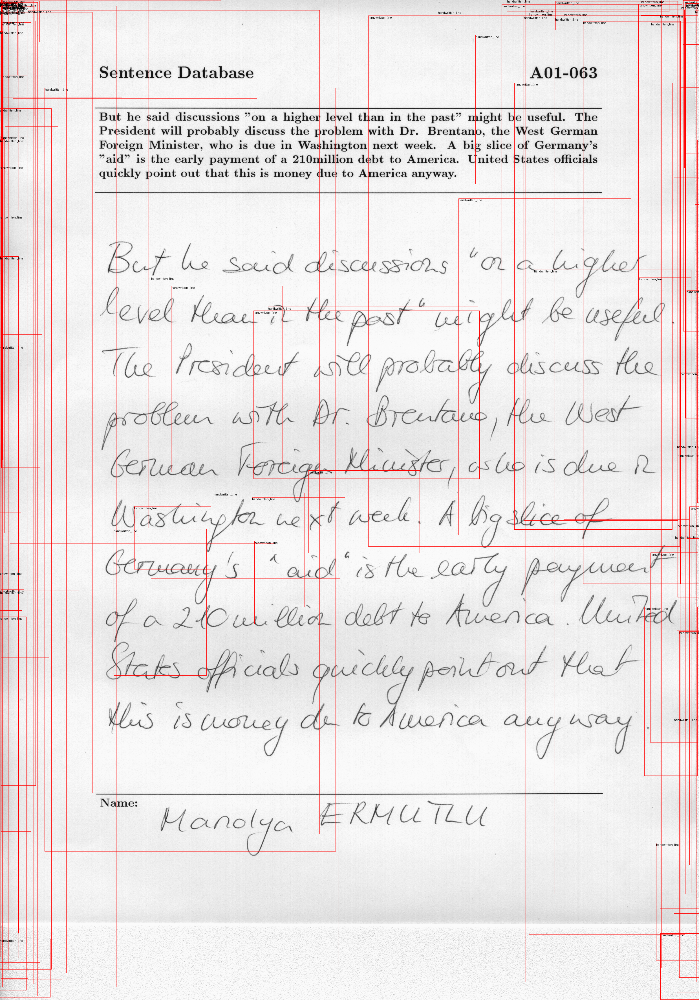

In [65]:
image = Image.open('data/iam_form2.png').convert('RGB')

with torch.no_grad():
    inputs = image_processor(images=[image], return_tensors="pt")
    outputs = model(**inputs.to("mps"))
    target_sizes = torch.tensor([[image.size[1], image.size[0]]])
    results = image_processor.post_process_object_detection(outputs, threshold=0.3, target_sizes=target_sizes)[0]

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    print(
        f"Detected {model.config.id2label[label.item()]} with confidence "
        f"{round(score.item(), 3)} at location {box}"
    )

draw = ImageDraw.Draw(image)

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    x, y, x2, y2 = tuple(box)
    draw.rectangle((x, y, x2, y2), outline="red", width=1)
    draw.text((x, y), model.config.id2label[label.item()], fill="black")

image